# **Importar Librerias Necesarias**

In [0]:
%pip install emoji
%pip install wordcloud
%pip install matplotlib

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.
Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
import re
import emoji
import builtins

import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from wordcloud import WordCloud

from pyspark.sql import Row
from pyspark.sql import SparkSession
from pyspark.sql.functions import *
from pyspark.sql import functions as F
from pyspark.sql.window import Window
from IPython.display import display, HTML
from pyspark.sql.types import StringType, NumericType
from pyspark.ml.feature import Tokenizer, StopWordsRemover, RegexTokenizer

# **Crear Sesión Spark**

In [0]:
spark = SparkSession.builder \
    .appName("EDA_Suicide_Watch") \
    .getOrCreate()

---


---
#<center> **Introducción Conjunto de Datos**</center>
---


---



Este conjunto de datos proviene de publicaciones realizadas en la plataforma Reddit, específicamente en comunidades enfocadas en temas de apoyo emocional y prevención del suicidio. El dataset reúne textos escritos por usuarios y los clasifica según si expresan o no indicios de ideación suicida.

El objetivo del conjunto de datos es utilizar el contenido textual de estas publicaciones para construir modelos capaces de identificar y clasificar mensajes asociados a riesgo suicida, apoyando tareas de análisis y detección temprana mediante técnicas de procesamiento de lenguaje natural.

---


---
#<center> **Descripción Datos**</center>
---


---



En esta sección se realizará la importación, visualización y exploración inicial del conjunto de datos. El dataset está compuesto por publicaciones de usuarios y contiene únicamente tres campos principales. A continuación, se presenta una breve descripción de cada uno:

**Atributos del conjunto de datos:**

* **id**: Identificador numérico único asignado a cada publicación.
* **text**: Contenido textual escrito por el usuario; corresponde al mensaje completo que será analizado mediante técnicas de procesamiento de lenguaje natural.
* **class**: Etiqueta asociada a la publicación, indicando si el texto presenta características relacionadas con riesgo suicida (*suicide*) o si corresponde a un mensaje sin dichas señales (*non-suicide*).

Estos campos conforman la base para el proceso de análisis y el desarrollo de modelos de clasificación textual.


# **Cargar Tabla Registrada Unity Catalog**

Aqui se realizará la carga del conjunto de datos directamente desde la tabla registrada en el entorno de trabajo de Spark. Una vez importada, se muestra su contenido para verificar que la lectura se haya realizado correctamente y para obtener una primera vista general de las filas y columnas disponibles.

In [0]:
df = spark.table("workspace.suicide_detection.suicide_detection_raw")
display(df)

id,text,class
2,"Ex Wife Threatening SuicideRecently I left my wife for good because she has cheated on me twice and lied to me so much that I have decided to refuse to go back to her. As of a few days ago, she began threatening suicide. I have tirelessly spent these paat few days talking her out of it and she keeps hesitating because she wants to believe I'll come back. I know a lot of people will threaten this in order to get their way, but what happens if she really does? What do I do and how am I supposed to handle her death on my hands? I still love my wife but I cannot deal with getting cheated on again and constantly feeling insecure. I'm worried today may be the day she does it and I hope so much it doesn't happen.",suicide
3,Am I weird I don't get affected by compliments if it's coming from someone I know irl but I feel really good when internet strangers do it,non-suicide
4,"Finally 2020 is almost over... So I can never hear ""2020 has been a bad year"" ever again. I swear to fucking God it's so annoying",non-suicide
8,i need helpjust help me im crying so hard,suicide
9,"I’m so lostHello, my name is Adam (16) and I’ve been struggling for years and I’m afraid. Through these past years thoughts of suicide, fear, anxiety I’m so close to my limit . I’ve been quiet for so long and I’m too scared to come out to my family about these feelings. About 3 years ago losing my aunt triggered it all. Everyday feeling hopeless , lost, guilty, and remorseful over her and all the things I’ve done in my life,but thoughts like these with the little I’ve experienced in life? Only time I’ve revealed these feelings to my family is when I broke down where they saw my cuts. Watching them get so worried over something I portrayed as an average day made me feel absolutely dreadful. They later found out I was an attempt survivor from attempt OD(overdose from pills) and attempt hanging. All that happened was a blackout from the pills and I never went through with the noose because I’m still so afraid. During my first therapy I was diagnosed with severe depression, social anxiety, and a eating disorder. I was later transferred to a fucken group therapy for some reason which made me feel more anxious. Eventually before my last session with a 1 on 1 therapy she showed me my results from a daily check up on my feelings(which was a 2 - step survey for me and my mom/dad ) Come to find out as I’ve been putting feeling horrible and afraid/anxious everyday , my mom has been doing I’ve been doing absolutely amazing with me described as “happiest she’s ever seen me, therapy has helped him” I eventually was put on Sertaline (anti anxiety or anti depression I’m sorry I forgot) but I never finished my first prescription nor ever found the right type of anti depressant because my mom thought I only wanted the drugs so she took me off my recommended pill schedule after ~3 week and stopped me from taking them. All this time I’ve been feeling worse afraid of the damage/ worry I’ve caused them even more. Now here with everything going on, I’m as afraid as I’ve ever been . I’ve relapsed on cutting and have developed severe insomnia . Day after day feeling more hopeless, worthless questioning why am I still here? What’s my motivation to move out of bed and keep going? I ask these to myself nearly every night almost having a break down everytime. Please Please Please someone.. anyone help me. I’m so scared I might do something drastic, I’ve been shaped by fear and anxiety. Idk what to do anymore",suicide
11,"Honetly idkI dont know what im even doing here. I just feel like there is nothing and nowhere for me. All i can feel is either nothing or unbearably sad. Im ignoring friends every opitunity i can. I feel like im loosing my girlfriend. I only hurt everyone i talk too and i dont cause anything good. Im behind on my education, i feel alone but for the first time its not a feeling ive enjoyed. I have no hopes or dreams. I care about nothing, not family, not friends,

# **Exploración Conjunto de Datos**

En esta etapa se realizará una exploración inicial del conjunto de datos con el fin de comprender su estructura, contenido y características principales. Este análisis preliminar permitirá identificar patrones, distribuciones, posibles inconsistencias o valores atípicos, y en general obtener una visión clara del material con el que se trabajará. El objetivo será establecer una comprensión sólida de los datos antes de avanzar hacia los procesos de preparación y modelado.

### **Tipo de Datos**

En este paso se realizará una revisión inicial de la estructura del conjunto de datos. Se obtendrá el número total de registros y columnas disponibles, y se visualizará el esquema de la tabla para identificar los tipos de datos asociados a cada campo.

In [0]:
print(f"Total de registros: {df.count()}")
print(f"Total de columnas: {len(df.columns)}")
df.printSchema()

Total de registros: 232074
Total de columnas: 3
root
 |-- id: long (nullable = true)
 |-- text: string (nullable = true)
 |-- class: string (nullable = true)



### **Análisis Descriptivo Datos Numéricos y Categóricos**

En este paso se identificarán las columnas que contienen valores numéricos y se generan estadísticas descriptivas básicas sobre ellas. Esta información permitíra obtener una primera comprensión del comportamiento general de las variables cuantitativas presentes en el conjunto de datos, facilitando la detección de posibles valores atípicos, rangos de variación y patrones iniciales que puedan influir en el análisis posterior.

In [0]:
# Seleccionar solo columnas numéricas
numeric_cols = [f.name for f in df.schema.fields if isinstance(f.dataType, NumericType)]

# Mostrar estadísticas descriptivas en formato tabla (Databricks)
display(df.select(numeric_cols).describe())

DataFrame[summary: string, id: string]

En este paso se realizará un análisis descriptivo de las columnas de tipo texto presentes en el conjunto de datos. Se calculará la cantidad de valores no nulos, el número de categorías únicas y la frecuencia de aparición de los valores más comunes en cada columna.

In [0]:
# Columnas no numéricas
string_cols = [f.name for f in df.schema.fields if isinstance(f.dataType, StringType)]

# Generar estadísticas tipo pandas.describe()
result = []
for c in string_cols:
    top_row = df.groupBy(c).count().orderBy(F.desc("count")).first()
    result.append((
        c,
        df.filter(F.col(c).isNotNull()).count(),
        df.select(c).distinct().count(),
        top_row[c] if top_row else None,
        top_row["count"] if top_row else 0
    ))

# Crear DataFrame con resultados
display(spark.createDataFrame(result, ["column", "count", "unique", "top", "freq"]))

DataFrame[column: string, count: bigint, unique: bigint, top: string, freq: bigint]

### **Información Datos Nulos o Faltantes**

En este paso se realizará una evaluación de valores faltantes dentro del conjunto de datos. Se calculará la cantidad de registros nulos o vacíos presentes en cada columna, lo que permitirá identificar posibles problemas de calidad de datos y determinar si será necesario aplicar técnicas de limpieza o imputación en fases posteriores del proceso.

In [0]:
null_counts = df.select([
    F.count(F.when(F.col(c).isNull() | (F.trim(F.col(c)) == F.lit('')), c)).alias(c)
    for c in df.columns
])

display(null_counts)

DataFrame[id: bigint, text: bigint, class: bigint]

---


---
#<center> **Visualización Conjunto Datos**</center>
---


---


En esta sección se realizará la generación de diferentes visualizaciones con el fin de comprender de manera más intuitiva la distribución y el comportamiento de las variables del conjunto de datos. Estas representaciones gráficas permitirán identificar tendencias, patrones, posibles anomalías y relaciones relevantes que complementarán el análisis exploratorio previo y servirán como base para una interpretación más profunda de los datos.

###**Distribución Clases**

En este apartado se realizará la visualización de la distribución de las clases presentes en el conjunto de datos. Para ello, se calculará el número de registros pertenecientes a cada etiqueta y se generará un gráfico interactivo que permitirá identificar el balance o desbalance entre las categorías. Esta representación facilitará comprender la composición del dataset y anticipar posibles implicaciones en etapas posteriores de modelado.

In [0]:
# Convertir Spark DF a pandas
class_dist = df.groupBy("class").count().toPandas().copy()

# Tipos
class_dist["class"] = class_dist["class"].astype(str)
class_dist["count"] = class_dist["count"].astype(int)

# Colores pastel ultra suaves con transparencia
soft_colors = [
    "rgba(102, 194, 165, 0.50)",
    "rgba(141, 160, 203, 0.50)",
    "rgba(252, 141, 98, 0.50)",
    "rgba(231, 138, 195, 0.50)",
    "rgba(166, 216, 84, 0.50)"
]

# Gráfico interactivo
fig = px.bar(
    class_dist,
    x="class",
    y="count",
    text="count",
    color="class",
    color_discrete_sequence=soft_colors,
    hover_data={"count": ":,"}
)

# Ajustar estilo de barras
fig.update_traces(
    width=0.35,
    marker=dict(line=dict(width=0)),
    texttemplate="%{text:,}",
    textposition="outside"
)

# Layout con fuente Algerian
fig.update_layout(
    title="Distribución Clases",
    title_x=0.5,
    xaxis_title="Clase",
    yaxis_title="Cantidad de textos",
    font=dict(
        family="Algerian, DejaVu Sans, sans-serif",
        size=16
    ),
    template="simple_white",
    bargap=0.42,
    showlegend=False,
    height=500,
    width=650,
    margin=dict(l=30, r=30, t=70, b=40)
)

# Números eje Y con separador de miles
fig.update_yaxes(tickformat=",")

fig.show()

###**Longitud Promedio Texto X Clase**

En este apartado se realizará un análisis de la longitud de los textos presentes en el conjunto de datos, tanto a nivel general como diferenciando entre clases. Se calcularán estadísticas básicas sobre la extensión de los mensajes y se generará un gráfico comparativo que permitirá visualizar la longitud promedio del texto para cada categoría. Este análisis facilitará identificar diferencias en la forma en que se expresan los usuarios según la clase asignada, lo cual podrá aportar información relevante para el proceso de modelado.

In [0]:
# Generar nueva columna con longitud de texto
df_temp = df.withColumn("text_length", length(col("text")))

# Estadísticas generales
df_temp.selectExpr(
    "avg(text_length) as Promedio",
    "min(text_length) as Minimo",
    "max(text_length) as Maximo"
).show()

# Longitud promedio por clase
length_stats = df_temp.groupBy("class").avg("text_length").toPandas()
length_stats.rename(columns={"avg(text_length)": "avg_length"}, inplace=True)

# Colores pastel suaves con transparencia
soft_colors = [
    "rgba(141, 160, 203, 0.50)",
    "rgba(252, 141, 98, 0.50)"
]

# Gráfico
fig = px.bar(
    length_stats,
    x="class",
    y="avg_length",
    text="avg_length",
    color="class",
    color_discrete_sequence=soft_colors,
    hover_data={"avg_length": ":,"}
)

# Ajustes visuales
fig.update_traces(
    width=0.35,
    marker=dict(line=dict(width=0)),
    texttemplate="%{text:,.0f}",
    textposition="outside"
)

fig.update_layout(
    title="Longitud Promedio Texto X Clase",
    title_x=0.5,
    xaxis_title="Clase",
    yaxis_title="Longitud Promedio",
    font=dict(
        family="Algerian, DejaVu Sans, sans-serif",
        size=16
    ),
    template="simple_white",
    bargap=0.42,
    showlegend=False,
    height=500,
    width=650,
    margin=dict(l=40, r=40, t=70, b=40)
)

# Eje Y con separador de miles
fig.update_yaxes(tickformat=",")

fig.show()

+-----------------+------+------+
|         Promedio|Minimo|Maximo|
+-----------------+------+------+
|689.6397356015754|     3| 40297|
+-----------------+------+------+



###**Distribución Longitud Texto Mediante Diagramas De Caja**

En este apartado se realizará un análisis más detallado de la distribución de la longitud de los textos mediante el uso de diagramas de caja. Para ello, se generará una muestra controlada del conjunto de datos, asegurando reproducibilidad y un manejo eficiente del volumen de registros. Posteriormente, se construirá un boxplot interactivo que permitirá visualizar la variabilidad, dispersión y presencia de valores atípicos en la extensión de los mensajes según cada clase. Esta representación facilitará identificar diferencias estructurales entre categorías y aportará una visión más profunda sobre el comportamiento textual del dataset.

In [0]:
# Parámetros
max_rows = 232074
seed = 42

# Generar nueva columna con longitud de texto
df_temp = df.withColumn("text_length", length(col("text")))

# Convertir a pandas
pdf = df_temp.select("class", "text_length").toPandas()
pdf["class"] = pdf["class"].astype(str)

# Condicional a max_rows
if len(pdf) > max_rows:
    pdf = pdf.sample(max_rows, random_state=seed)

# Colores pastel ultra suaves
soft_colors = [
    "rgba(102, 194, 165, 0.50)",
    "rgba(141, 160, 203, 0.50)",
    "rgba(252, 141, 98, 0.50)",
    "rgba(231, 138, 195, 0.50)",
    "rgba(166, 216, 84, 0.50)"
]

# Gráfico interactivo
fig = px.box(
    pdf,
    x="class",
    y="text_length",
    points="all",
    hover_data=["text_length", "class"],
    color="class",
    color_discrete_sequence=soft_colors,
    title="Distribución Longitud Texto X Clase - Boxplot"
)

# Ajustes al gráfico interactivo
fig.update_traces(
    pointpos=0,
    jitter=0.30,
    marker=dict(size=3, opacity=0.55, line=dict(width=0)),
    width=0.95
)

# Layout grande y elegante
fig.update_layout(
    title_x=0.5,
    xaxis_title="Clase",
    yaxis_title="Longitud del Texto",
    font=dict(
        family="Algerian, DejaVu Sans, sans-serif",
        size=18
    ),
    template="simple_white",
    height=800,
    width=800,
    showlegend=False,
    margin=dict(l=80, r=80, t=110, b=80)
)

# Zoom basado en IQR global para alargar visualmente las cajas
q1 = pdf['text_length'].quantile(0.25)
q3 = pdf['text_length'].quantile(0.75)
iqr = q3 - q1

# Ajustar el factor para aumentar/disminuir el zoom (1.0 = menos zoom, 2.5 = más zoom)
zoom_factor = 2.5
margin = iqr * zoom_factor

y_min = builtins.max(0, q1 - margin)
y_max = q3 + margin

fig.update_yaxes(range=[y_min, y_max], tickformat=",")

# Mostrar gráfico
fig.show()

###**Distribución Longitud Texto Mediante Diagramas De Violín**

En este apartado se realizará un análisis detallado de la distribución de la longitud de los textos utilizando gráficos de violín. Se generará una muestra controlada del conjunto de datos para garantizar eficiencia y reproducibilidad, y posteriormente se visualizará la densidad, dispersión y variabilidad de los mensajes según cada clase. Este tipo de gráfico permitirá observar patrones más complejos, como concentraciones de valores, presencia de asimetrías y diferencias estructurales entre categorías, proporcionando una visión enriquecida del comportamiento textual del dataset.

In [0]:
# Parámetros
max_rows = 232074
seed = 42

# Generar nueva columna con longitud de texto
df_temp = df.withColumn("text_length", length(col("text")))

# Convertir a pandas
pdf = df_temp.select("class", "text_length").toPandas()
pdf["class"] = pdf["class"].astype(str)

# Condicional a máximo registros
if len(pdf) > max_rows:
    pdf = pdf.sample(max_rows, random_state=seed)

# Colores pastel ultra suaves
soft_colors = [
    "rgba(102, 194, 165, 0.50)",
    "rgba(141, 160, 203, 0.50)",
    "rgba(252, 141, 98, 0.50)",
    "rgba(231, 138, 195, 0.50)",
    "rgba(166, 216, 84, 0.50)"
]

# Gráfico de violín
fig = px.violin(
    pdf,
    x="class",
    y="text_length",
    color="class",
    color_discrete_sequence=soft_colors,
    box=True,
    points="all",
    hover_data=["class", "text_length"],
    title="Distribución Longitud Texto X Clase - Violín"
)

# Ajustes estéticos
fig.update_traces(
    meanline_visible=True,
    jitter=0.30,
    marker=dict(
        size=3,
        opacity=0.55,
        line=dict(width=0)
    )
)

# Layout elegante con fuente Algerian
fig.update_layout(
    title_x=0.5,
    xaxis_title="Clase",
    yaxis_title="Longitud del Texto",
    font=dict(
        family="Algerian, DejaVu Sans, sans-serif",
        size=18
    ),
    template="simple_white",
    height=700,
    width=900,
    showlegend=False,
    margin=dict(l=80, r=80, t=110, b=60)
)

fig.update_yaxes(tickformat=",")

# Mostrar gráfico
fig.show()

###**Dispersión Longitud Texto X Clase**

En este apartado se realizará una visualización de la relación entre la clase asignada a cada texto y su longitud mediante un gráfico de dispersión. Se representará cada registro como un punto en el plano, permitiendo observar patrones de concentración, dispersión y posibles diferencias estructurales entre las clases. Esta visualización facilitará identificar áreas de solapamiento, rangos característicos y comportamientos particulares en la extensión de los mensajes según cada categoría.

In [0]:
# Parámetros
max_rows = 232074
seed = 42

# Generar nueva columna con longitud de texto
df_temp = df.withColumn("text_length", length(col("text")))

# Convertir a pandas
pdf = df_temp.select("class", "text_length").toPandas()
pdf["class"] = pdf["class"].astype(str)

# Condicional a máximo registros
if len(pdf) > max_rows:
    pdf = pdf.sample(max_rows, random_state=seed)

# Colores pastel base
base_colors = [
    "rgba(102, 194, 165, 0.50)",
    "rgba(141, 160, 203, 0.50)",
    "rgba(252, 141, 98, 0.50)",
    "rgba(231, 138, 195, 0.50)",
    "rgba(166, 216, 84, 0.50)"
]

# Obtener clases y códigos
pdf["class_num"] = pdf["class"].astype('category').cat.codes

# Orden original de clases según class_num
original_classes = pdf.sort_values("class_num")["class"].unique().tolist()

# Invertir clases para reflejo horizontal
inverted_classes = original_classes[::-1]

# Crear mapeo dinámico de colores para las clases invertidas
colors_inverted = {cls: base_colors[i] for i, cls in enumerate(inverted_classes)}

# Crear códigos invertidos para eje X
code_map = {old: new for old, new in zip(range(len(original_classes)), range(len(inverted_classes)-1, -1, -1))}
pdf["class_num_inv"] = pdf["class_num"].map(code_map)

# Gráfico de dispersión
fig = px.scatter(
    pdf,
    x="class_num_inv",
    y="text_length",
    color="class",
    color_discrete_map=colors_inverted,
    hover_data=["class", "text_length"],
    title="Dispersión Longitud Texto X Clase"
)

# Ajustes estéticos
fig.update_traces(
    marker=dict(
        size=6,
        opacity=0.45,
        line=dict(width=0)
    )
)

fig.update_xaxes(
    tickmode="array",
    tickvals=list(range(len(inverted_classes))),
    ticktext=inverted_classes,
    title="Clase"
)

fig.update_layout(
    title_x=0.5,
    yaxis_title="Longitud del Texto",
    font=dict(
        family="Algerian, DejaVu Sans, sans-serif",
        size=18
    ),
    template="simple_white",
    height=550,
    width=550,
    showlegend=False,
    margin=dict(l=80, r=80, t=110, b=60)
)

fig.update_yaxes(tickformat=",")

# Mostrar gráfico
fig.show()

###**Histograma Longitud Texto X Clase**

En este apartado se realizará una comparación visual de la distribución de la longitud de los textos entre las clases presentes en el conjunto de datos. Para ello, se generarán histogramas independientes para cada categoría, permitiendo observar cómo se concentran los valores, qué rangos son más frecuentes y qué diferencias existen en la extensión de los mensajes según cada clase. Esta visualización facilitará identificar patrones de distribución, posibles asimetrías y contrastes significativos entre los grupos, proporcionando una comprensión más profunda del comportamiento textual dentro del dataset.

In [0]:
# Parámetros
max_rows = 232074
seed = 42

# Generar nueva columna con longitud de texto
df_temp = df.withColumn("text_length", length(col("text")))

# Convertir a pandas
pdf = df_temp.select("class", "text_length").toPandas()
pdf["class"] = pdf["class"].astype(str)

# Condicional a máximo registros
if len(pdf) > max_rows:
    pdf = pdf.sample(max_rows, random_state=seed)

# Colores pastel suaves
color_suicide     = "rgba(252, 141, 98, 0.65)"
color_non_suicide = "rgba(141, 160, 203, 0.65)"

# Dividir el DataFrame
pdf_suicide     = pdf[pdf["class"] == "suicide"]
pdf_non_suicide = pdf[pdf["class"] == "non-suicide"]

# Crear subplots
fig = make_subplots(
    rows=1,
    cols=2,
    subplot_titles=(
        "Histograma – Clase SUICIDE",
        "Histograma – Clase NON-SUICIDE"
    )
)

# Histograma suicide
fig.add_trace(
    go.Histogram(
        x=pdf_suicide["text_length"],
        nbinsx=50,
        marker=dict(color=color_suicide, line=dict(width=0)),
        opacity=0.75,
        hovertemplate="Longitud: %{x}<br>Frecuencia: %{y}<extra></extra>"
    ),
    row=1, col=1
)

#  Histograma non-suicide
fig.add_trace(
    go.Histogram(
        x=pdf_non_suicide["text_length"],
        nbinsx=50,
        marker=dict(color=color_non_suicide, line=dict(width=0)),
        opacity=0.75,
        hovertemplate="Longitud: %{x}<br>Frecuencia: %{y}<extra></extra>"
    ),
    row=1, col=2
)

# Layout elegante con fuente Algerian
fig.update_layout(
    title="Histograma Longitud Texto X Clase",
    title_x=0.5,
    font=dict(
        family="Algerian, DejaVu Sans, sans-serif",
        size=18
    ),
    template="simple_white",
    height=550,
    width=1200,
    bargap=0.02,
    margin=dict(l=60, r=60, t=90, b=60)
)

# Etiquetas de ejes
fig.update_xaxes(title_text="Longitud Texto", row=1, col=1)
fig.update_yaxes(title_text="Frecuencia", row=1, col=1)

fig.update_xaxes(title_text="Longitud Texto", row=1, col=2)
fig.update_yaxes(showticklabels=False, row=1, col=2)  # ocultar eje Y derecho para estética

# Separador de miles en Y del primer subplot
fig.update_yaxes(tickformat=",", row=1, col=1)

# Mostrar gráfico
fig.show()

###**Nube Palabras Global Corpus**

En este apartado se procederá a construir una nube de palabras con el objetivo de identificar, de manera visual, los términos más frecuentes presentes en el corpus completo. Para ello, primero se tokenizarán los textos, se eliminarán las stopwords y se filtrarán palabras demasiado cortas para garantizar la calidad del análisis. Luego, se calcularán las frecuencias globales y se seleccionarán las 100 palabras más comunes. Finalmente, se generará una Word Cloud que permitirá observar de forma sintetizada los patrones léxicos predominantes en el conjunto de datos.

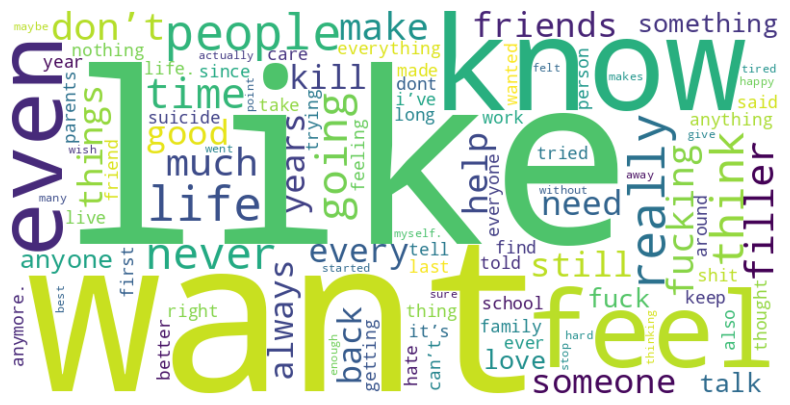

In [0]:
# Tokenizar el texto
tokenizer = Tokenizer(inputCol="text", outputCol="words")
wordsData = tokenizer.transform(df)

# Remover stopwords en inglés
remover = StopWordsRemover(inputCol="words", outputCol="filtered_words")
cleanData = remover.transform(wordsData)

# Contar palabras más frecuentes
top_words = (
    cleanData
    .select(F.explode(F.col("filtered_words")).alias("word"))
    .filter(F.length("word") > 3)
    .groupBy("word")
    .count()
    .orderBy(F.desc("count"))
)

# Convertir top_words a Pandas para graficar
top_pd = top_words.limit(100).toPandas()

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(zip(top_pd['word'], top_pd['count'])))

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

###**Nubes Palabras X Clase**

En este apartado se generarán nubes de palabras independientes para cada clase con el fin de visualizar las diferencias léxicas más representativas entre suicide y non-suicide. Para ello, se tokenizarán los textos, se eliminarán las stopwords y se reconstruirá un texto limpio por documento. Luego, se unirá el contenido de cada clase en un corpus consolidado y se aplicará la técnica de Word Cloud para resaltar las palabras más frecuentes. Esto permitirá comparar de forma intuitiva los patrones lingüísticos distintivos de cada categoría.

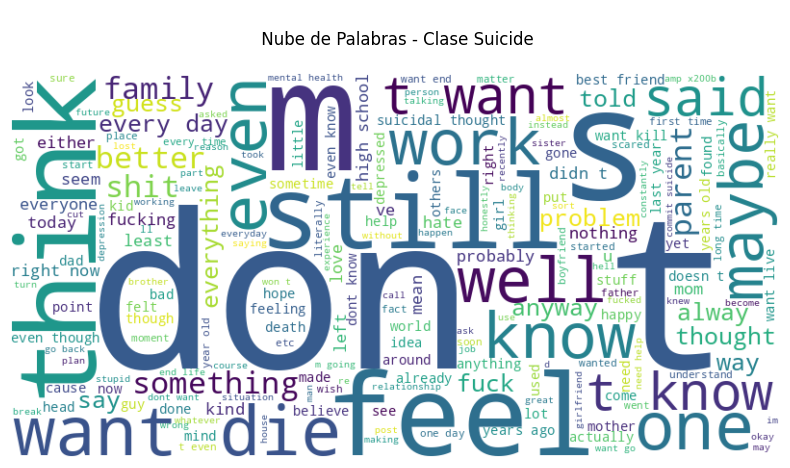

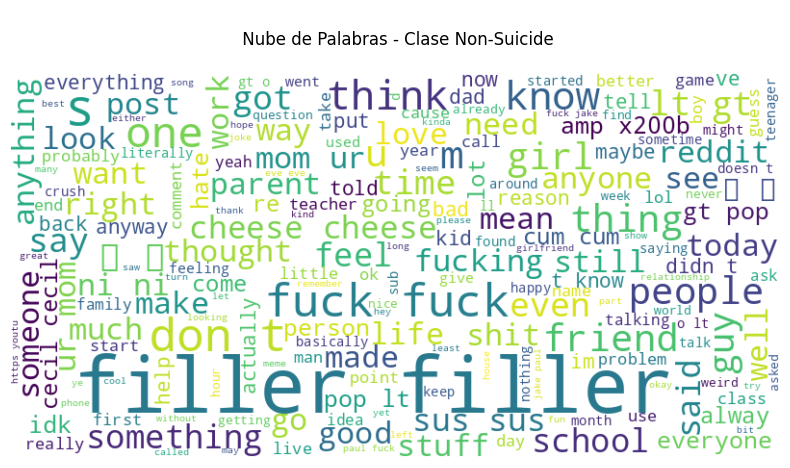

In [0]:
# Tokenizar texto
tokenizer = Tokenizer(inputCol="text", outputCol="words")
df_tokens = tokenizer.transform(df)

# Remover stopwords y reconstruir texto limpio
remover = StopWordsRemover(inputCol="words", outputCol="clean_words")
df_clean = remover.transform(df_tokens).withColumn("clean_text", concat_ws(" ", col("clean_words")))

# Separar por clase
df_suicide = df_clean.filter(col("class") == "suicide")
df_non_suicide = df_clean.filter(col("class") == "non-suicide")

# Función para generar la nube de palabras
def generar_wordcloud(df_class, titulo):
    text_pd = df_class.select("clean_text").toPandas()
    texto = " ".join(text_pd["clean_text"].tolist())
    wc = WordCloud(width=800, height=400, background_color="white").generate(texto)
    plt.figure(figsize=(10,5))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(titulo)
    plt.show()

# Generar nubes por clase
generar_wordcloud(df_suicide, "\n Nube de Palabras - Clase Suicide\n")
generar_wordcloud(df_non_suicide, "\n Nube de Palabras - Clase Non-Suicide\n")

###**Palabras Más Frecuentes X Clase - Top 20**

En este apartado se realizará un análisis lexical para identificar las palabras más frecuentes en cada clase del conjunto de datos. Para ello, se llevará a cabo un proceso de tokenización, limpieza y eliminación de palabras vacías, seguido por la expansión del texto para analizar cada término de manera individual. Posteriormente, se calculará la frecuencia de aparición de cada palabra y se generarán visualizaciones que mostrarán los 20 términos más comunes dentro de cada clase. Este análisis permitirá comprender mejor el vocabulario característico de cada categoría y aportará información relevante sobre patrones lingüísticos presentes en los textos.

In [0]:
# Tokenizar texto limpio
tokenizer = RegexTokenizer(
    inputCol="text",
    outputCol="words",
    pattern="\\W+",
    toLowercase=True
)

df_tok = tokenizer.transform(df)

# Eliminar stopwords en inglés
remover = StopWordsRemover(
    inputCol="words",
    outputCol="filtered_words"
)

df_filt = remover.transform(df_tok)

#  Explode → una palabra por fila
df_words = df_filt.select(
    col("class"),
    explode(col("filtered_words")).alias("word")
)

# Filtrar vacíos y palabras cortas
df_words = df_words.filter(
    (col("word") != "") &
    (length(col("word")) > 3)
)

# Contar palabras por clase
df_counts = df_words.groupBy("class", "word").count()

# Convertir a pandas
pdf = df_counts.toPandas()
pdf["class"] = pdf["class"].astype(str)

# Top 20 por clase
top_suicide = (
    pdf[pdf["class"] == "suicide"]
    .sort_values("count", ascending=False)
    .head(20)
)

top_non = (
    pdf[pdf["class"] == "non-suicide"]
    .sort_values("count", ascending=False)
    .head(20)
)

# Colores pastel ultra suaves
soft_colors = [
    "rgba(102, 194, 165, 0.55)",
    "rgba(141, 160, 203, 0.55)",
    "rgba(252, 141, 98, 0.55)",
    "rgba(231, 138, 195, 0.55)",
    "rgba(166, 216, 84, 0.55)"
]

# Gráfico suicide
fig1 = px.bar(
    top_suicide,
    x="word",
    y="count",
    text="count",
    color="word",
    color_discrete_sequence=soft_colors,
    title="Top 20 Palabras Más Frecuentes — Clase Suicide",
    hover_data={"count": ":,"}
)

fig1.update_traces(
    marker=dict(line=dict(width=0)),
    texttemplate="%{text:,}",
    textposition="outside"
)

fig1.update_layout(
    title_x=0.5,
    xaxis_title="Palabra",
    yaxis_title="Frecuencia",
    font=dict(family="Algerian, DejaVu Sans, sans-serif", size=18),
    template="simple_white",
    bargap=0.40,
    showlegend=False,
    height=520,
    width=900,
    margin=dict(l=60, r=60, t=80, b=120)
)

# Gráfico non-suicide
fig2 = px.bar(
    top_non,
    x="word",
    y="count",
    text="count",
    color="word",
    color_discrete_sequence=soft_colors,
    title="Top 20 Palabras Más Frecuentes — Clase Non-Suicide",
    hover_data={"count": ":,"}
)

fig2.update_traces(
    marker=dict(line=dict(width=0)),
    texttemplate="%{text:,}",
    textposition="outside"
)

fig2.update_layout(
    title_x=0.5,
    xaxis_title="Palabra",
    yaxis_title="Frecuencia",
    font=dict(family="Algerian, DejaVu Sans, sans-serif", size=18),
    template="simple_white",
    bargap=0.40,
    showlegend=False,
    height=520,
    width=900,
    margin=dict(l=60, r=60, t=80, b=120)
)

# Mostrar gráficos
fig1.show()
fig2.show()

###**Análisis Bigramas X Clase - Top 20**

En este apartado se procederá a construir bigramas (pares consecutivos de palabras) con el fin de identificar combinaciones léxicas representativas dentro de cada clase del conjunto de datos. Para optimizar el rendimiento, primero se tomará una muestra del corpus y se aplicará un proceso de limpieza que incluirá la normalización del texto y la eliminación de caracteres no alfabéticos. Posteriormente, se realizará la tokenización, se eliminarán las palabras vacías y se filtrarán términos demasiado cortos para asegurar la calidad de los bigramas generados.

Una vez construidos los bigramas válidos, se llevará a cabo un conteo por clase y se seleccionarán los 20 más frecuentes en cada categoría. Finalmente, se generarán visualizaciones en formato horizontal que permitirán identificar patrones lingüísticos compuestos, aportando una perspectiva más profunda sobre las asociaciones de palabras que caracterizarán los textos de cada clase

In [0]:
#  Muestra para acelerar el procesamiento
sample_fraction = 0.20

df_sample = df.sample(False, sample_fraction, seed=42)

# Normalizar texto (minusculas y quitar caracteres no alfabéticos)
df_clean = df_sample.select(
    "class",
    lower(regexp_replace(col("text"), r"[^a-zA-Z\s]", " ")).alias("text")
)

# Tokenizar texto limpio
tokenizer = Tokenizer(inputCol="text", outputCol="words")
df_words = tokenizer.transform(df_clean)

# Eliminar stopwords en inglés
remover = StopWordsRemover(inputCol="words", outputCol="filtered_words")
df_no_stop = remover.transform(df_words)

# Filtrar palabras cortas
df_long = df_no_stop.withColumn(
    "long_words",
    F.expr("filter(filtered_words, w -> length(w) > 3)")
)

# Gnerar Bigramas (solo si hay ≥ 2 palabras válidas)
df_big = df_long.filter(size("long_words") >= 2)

df_big = df_big.select(
    "class",
    F.expr("""
        transform(
            sequence(0, size(long_words)-2),
            i -> concat_ws(' ', long_words[i], long_words[i+1])
        ) AS bigrams
    """)
)

# Explode → un bigrama por fila
df_big = df_big.select("class", explode(col("bigrams")).alias("bigram"))

# Filtrar bigramas nulos o vacíos
df_big = df_big.filter(col("bigram").isNotNull() & (col("bigram") != ""))

# Contar Bigramas
df_counts = df_big.groupBy("class", "bigram").count()

# Top 20 bigramas por clase
from pyspark.sql.window import Window
w = Window.partitionBy("class").orderBy(F.col("count").desc())

df_top20 = df_counts.withColumn("rank", F.row_number().over(w)) \
                    .filter(col("rank") <= 20)

# Convertir a Pandas
pdf = df_top20.toPandas()
pdf["class"] = pdf["class"].astype(str)

# Estilos de gráfico
soft_colors = [
    "rgba(102, 194, 165, 0.50)",
    "rgba(141, 160, 203, 0.50)",
]

# Mapeo clase → índice color
class_color_index = {
    "suicide": 0,
    "non-suicide": 1
}

# Función de gráficado
def plot_bigrams(cls, df_plot):

    color_index = class_color_index.get(cls, 0)

    fig = px.bar(
        df_plot,
        x="count",
        y="bigram",
        orientation="h",
        text="count",
        color_discrete_sequence=[soft_colors[color_index]],
        hover_data={"bigram": True, "count": ":,"},
        title=f"Top 20 Bigramas — Clase {cls}"
    )

    fig.update_traces(
        texttemplate="%{text:,}",
        textposition="inside",
        insidetextanchor="end",
        textfont=dict(color="black"),
        marker=dict(line=dict(width=0))
    )

    fig.update_layout(
        title_x=0.5,
        xaxis_title="Frecuencia",
        yaxis_title="Bigrama",
        font=dict(
            family="Algerian, DejaVu Sans, sans-serif",
            size=18
        ),
        template="simple_white",
        height=750,
        width=900,
        margin=dict(l=80, r=40, t=120, b=50)
    )

    fig.update_xaxes(tickformat=",")
    fig.show()

# Se obtiene las clases únicas en orden original
classes_order = list(pdf["class"].unique())

# Se invierte el orden de los graficos
classes_order = classes_order[::-1]

# Función de ordenamiento de gráficos
for cls in classes_order:
    df_cls = pdf[pdf["class"] == cls].sort_values("count", ascending=True)
    plot_bigrams(cls, df_cls)

###**Análisis Trigramas X Clase - Top 20**

En este apartado se procederá a generar trigramas (secuencias de tres palabras) consecutivas para identificar expresiones compuestas relevantes dentro de cada clase. Para ello, primero se tomará una muestra del conjunto de datos y se aplicará una limpieza básica del texto, incluyendo normalización y eliminación de caracteres no alfabéticos.

Luego se realizará la tokenización, la eliminación de stopwords y el filtrado de términos demasiado cortos, conservando únicamente los registros con suficientes palabras válidas para construir trigramas. A continuación, estos trigramas serán contados por clase y se seleccionarán los 20 más frecuentes. Finalmente, se generarán visualizaciones horizontales que permitirán resaltar las combinaciones léxicas más representativas de cada categoría.

In [0]:
# Parámetros
sample_fraction = 0.20 
seed = 42

#  Muestra para acelerar el procesamiento
df_proc = df.sample(False, sample_fraction, seed=seed) if sample_fraction < 1.0 else df

# Normalizar texto (minusculas y quitar caracteres no alfabéticos)
df_clean = df_proc.select(
    "class",
    lower(regexp_replace(col("text"), r"[^a-zA-Z\s]", " ")).alias("text")
)

# Tokenizar texto limpio
tokenizer = Tokenizer(inputCol="text", outputCol="words")
df_words = tokenizer.transform(df_clean)

# Eliminar stopwords
remover = StopWordsRemover(inputCol="words", outputCol="filtered_words")
df_no_stop = remover.transform(df_words)

# Filtrar palabras >= 3 letras
df_long = df_no_stop.withColumn(
    "filtered_words",
    F.expr("filter(filtered_words, w -> length(w) >= 3)")
)

# Filtrar filas con al menos 3 palabras válidas
df_with_min = df_long.filter(size("filtered_words") >= 3)

# Generar trigramas de forma robusta
df_trigrams = df_with_min.select(
    "class",
    F.expr("""
        transform(
            sequence(0, size(filtered_words)-3),
            i -> concat_ws(' ', filtered_words[i], filtered_words[i+1], filtered_words[i+2])
        ) AS trigrams
    """)
)

# Explode para tener un trigrama por fila
df_trigrams = df_trigrams.select("class", explode(col("trigrams")).alias("trigram"))

# Filtrar nulos/strings vacíos por si acaso
df_trigrams = df_trigrams.filter((col("trigram").isNotNull()) & (col("trigram") != ""))

# Contar trigramas por clase
df_counts = df_trigrams.groupBy("class", "trigram").count()

# Obtener top 20 por clase
from pyspark.sql.window import Window
w = Window.partitionBy("class").orderBy(F.col("count").desc())

df_top20 = df_counts.withColumn("rank", F.row_number().over(w)).filter(col("rank") <= 20)

# Convertir a pandas y preparar
pdf = df_top20.toPandas()
pdf["class"] = pdf["class"].astype(str)

# Orden descendente por clase antes de graficar
pdf = pdf.sort_values(["class", "count"], ascending=[True, False])

# Estilos y mapeo de colores
soft_colors = {
    "suicide": "rgba(252, 141, 98, 0.65)",
    "non-suicide": "rgba(141, 160, 203, 0.65)"
}

# Función para plotear top20 trigramas por clase
def plot_trigrams_for_class(cls, df_cls):
    df_plot = df_cls.sort_values("count", ascending=False).head(20)

    fig = px.bar(
        df_plot,
        x="count",
        y="trigram",
        orientation="h",
        text="count",
        color_discrete_sequence=[soft_colors.get(cls, "rgba(166,216,84,0.65)")],
        hover_data={"trigram": True, "count": ":,"},
        title=f"Top 20 Trigramas — Clase {cls}"
    )

    fig.update_traces(
        texttemplate="%{text:,}",
        textposition="inside",
        insidetextanchor="end",
        textfont=dict(color="black"),
        marker=dict(line=dict(width=0))
    )

    fig.update_layout(
        title_x=0.5,
        xaxis_title="Frecuencia",
        yaxis_title="Trigrama",
        font=dict(family="Algerian, DejaVu Sans, sans-serif", size=16),
        template="simple_white",
        height=700,
        width=900,
        margin=dict(l=120, r=40, t=100, b=50),
        showlegend=False
    )

    fig.update_xaxes(tickformat=",")
    fig.update_yaxes(autorange="reversed")
    fig.show()

# Generar 2 gráficos (invertir el orden de las clases)
classes_order = list(pdf["class"].unique())
classes_order = classes_order[::-1]

# Función de ordenamiento de gráficos
for cls in classes_order:
    df_cls = pdf[pdf["class"] == cls].sort_values("count", ascending=False)
    plot_trigrams_for_class(cls, df_cls)

###**Identificación Palabras Exclusivas X Clase**

En este apartado se identificarán aquellas palabras que serán exclusivas de cada clase, es decir, términos que aparecerán únicamente en una categoría del conjunto de datos. Para ello, primero se normalizará el texto y se aplicará un proceso de limpieza, que incluirá la tokenización, la eliminación de stopwords y el filtrado de palabras demasiado cortas.

Posteriormente, se realizará un conteo de frecuencia por clase y se determinarán los términos que aparecerán en una sola etiqueta. Con este conjunto depurado, se seleccionarán las 20 palabras más representativas por categoría. Finalmente, se generarán visualizaciones horizontales que permitirán resaltar los vocablos distintivos de cada clase, proporcionando una perspectiva lingüística clara sobre los elementos que caracterizarán de manera exclusiva a cada grupo.

In [0]:
# Normalizar texto (minusculas y quitar caracteres no alfabéticos)
df_clean = df.select(
    "class",
    lower(regexp_replace(col("text"), r"[^a-zA-Z\s]", " ")).alias("text")
)

# Tokenizar texto limpio
tokenizer = Tokenizer(inputCol="text", outputCol="words")
df_words = tokenizer.transform(df_clean)

# Eliminar stopwords
remover = StopWordsRemover(inputCol="words", outputCol="filtered_words")
df_sw = remover.transform(df_words)

# Filtrar palabras >= 3 letras
df_long = df_sw.withColumn(
    "filtered_words",
    F.expr("filter(filtered_words, x -> length(x) >= 3)")
)

# Explode: una palabra por fila
df_exploded = df_long.select("class", explode(col("filtered_words")).alias("word"))

# Contar palabras por clase
df_counts = df_exploded.groupBy("class", "word").count()

# Obtener palabras exclusivas
df_unique = df_counts.groupBy("word").agg(F.countDistinct("class").alias("class_count"))

# Solo palabras que aparecen en 1 sola clase
df_only_one = df_unique.filter(col("class_count") == 1)

# Unir para saber en cuál clase está cada palabra exclusiva
df_exclusive = df_only_one.join(df_counts, on="word").select("class", "word", "count")

# Top 20 de palabras más representativas por clase
w = Window.partitionBy("class").orderBy(col("count").desc())
df_top20 = df_exclusive.withColumn("rank", F.row_number().over(w)) \
                       .filter(col("rank") <= 20)

# Pandas y orden adecuado
pdf_exclusive = df_top20.toPandas()
pdf_exclusive["class"] = pdf_exclusive["class"].astype(str)

# Orden: suicide → non-suicide
ordered_classes = ["suicide", "non-suicide"]

# Función de gráfico
def plot_exclusive(cls, df_cls):
    df_plot = df_cls.sort_values("count", ascending=True)

    colors = {
        "suicide": "rgba(251, 128, 114, 0.70)",
        "non-suicide": "rgba(128, 177, 211, 0.70)"
    }

    fig = px.bar(
        df_plot,
        x="count",
        y="word",
        orientation="h",
        text="count",
        color_discrete_sequence=[colors.get(cls, "rgba(166,216,84,0.65)")],
        hover_data={"word": True, "count": ":,"},
        title=f"Top 20 Palabras Exclusivas — Clase {cls}"
    )

    fig.update_traces(
        texttemplate="%{text:,}",
        textposition="inside",
        insidetextanchor="end",
        textfont=dict(color="black"),
        marker=dict(line=dict(width=0))
    )

    fig.update_layout(
        title_x=0.5,
        xaxis_title="Frecuencia",
        yaxis_title="Palabra",
        font=dict(family="Algerian, DejaVu Sans, sans-serif", size=16),
        template="simple_white",
        height=700,
        width=900,
        margin=dict(l=120, r=40, t=100, b=50),
        showlegend=False
    )

    fig.update_xaxes(tickformat=",")
    fig.show()

# Graficar en el orden correcto
for cls in ordered_classes:
    df_cls = pdf_exclusive[pdf_exclusive["class"] == cls]
    plot_exclusive(cls, df_cls)

###**Longitud Texto X Clase Mediante Heatmap**

En este apartado se analizará la relación entre la longitud de los textos y su clase mediante un mapa de calor. Para ello, primero se calculará el número de caracteres de cada documento y se agruparán las longitudes en intervalos uniformes. Posteriormente, se construirá una tabla cruzada que permitirá visualizar cuántos textos se ubicarán en cada rango para ambas categorías.

Con esta estructura consolidada, se generará un heatmap interactivo que facilitará la identificación de patrones de distribución, diferencias entre clases y posibles sesgos de extensión en el corpus. Esta visualización ofrecerá una perspectiva clara sobre cómo varían las longitudes de los textos según la etiqueta asignada.

In [0]:
# Calcular longitud de cada texto
df_length = df.withColumn("text_length", F.length(F.col("text")))

# Convertir a Pandas
pdf_length = df_length.select("class", "text_length").toPandas()

# Crear bins de longitud
bins = list(range(0, 2000, 100))
labels = [f"{b}-{b+100}" for b in bins[:-1]]
pdf_length["length_bin"] = pd.cut(pdf_length["text_length"], bins=bins, labels=labels, include_lowest=True)

# Contar cantidad de textos por bin y clase
pivot = pdf_length.pivot_table(index="length_bin", columns="class", aggfunc="size", fill_value=0)

# Asegurar el orden de las clases
ordered_classes = ["suicide", "non-suicide"]
pivot = pivot[ordered_classes]

# Crear Heatmap interactivo con Plotly
fig = px.imshow(
    pivot,
    labels=dict(x="Clase", y="Rango de longitud", color="Número de textos"),
    text_auto=True,
    aspect="auto",
    color_continuous_scale="YlOrRd",
    title="Longitud texto x clase - Heatmap"
)

# Ajustes de estética
fig.update_layout(
    font=dict(family="Algerian, DejaVu Sans, sans-serif", size=16),
    height=800,
    width=900,
    title_x=0.5
)

fig.show()

/home/spark-2d86b542-1813-4541-95d8-27/.ipykernel/3364/command-7750053832534758-854180485:13: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior



###**Evolución Rango Longitud X Clase Mediante Linea De Tendencia**

En este apartado se representará la distribución del número de textos a lo largo de diferentes rangos de longitud, diferenciando ambas clases del conjunto de datos. Para ello, se calculará la cantidad de caracteres por registro, se agruparán los textos en intervalos uniformes y posteriormente se reorganizarán los datos en un formato adecuado para visualización. Finalmente, se construirá un gráfico de líneas que permitirá observar cómo varía la frecuencia de textos según su extensión, facilitando la identificación de tendencias generales y posibles diferencias estructurales entre las clases.

In [0]:
# Calcular longitud de cada texto
df_length = df.withColumn("text_length", F.length(F.col("text")))

# Convertir a Pandas
pdf_length = df_length.select("class", "text_length").toPandas()

# Crear bins de longitud
bins = list(range(0, 2000, 100))
labels = [f"{b}-{b+99}" for b in bins[:-1]]
pdf_length["length_bin"] = pd.cut(pdf_length["text_length"], bins=bins, labels=labels, include_lowest=True)

# Contar cantidad de textos por bin y clase
pivot = pdf_length.pivot_table(index="length_bin", columns="class", aggfunc="size", fill_value=0, observed=False)

# Asegurar el orden de las clases
ordered_classes = ["suicide", "non-suicide"]
pivot = pivot[ordered_classes]

# Preparar datos para Plotly
pdf_plot = pivot.reset_index().melt(
    id_vars="length_bin",
    value_vars=ordered_classes,
    var_name="class",
    value_name="text_count"
)

# Crear Line Plot limpio
fig = px.line(
    pdf_plot,
    x="length_bin",
    y="text_count",
    color="class",
    markers=False,
    labels={"length_bin":"Rango de longitud", "text_count":"Número de textos", "class":"Clase"},
    title="Evolución Rango Longitud X Clase - Linea de Tendencia"
)

# Ajustes de estética
fig.update_layout(
    font=dict(family="Algerian, DejaVu Sans, sans-serif", size=16),
    height=700,
    width=1000,
    title_x=0.75,
    xaxis_tickangle=-45,
    legend_title_text="Clase"
)

fig.show()

###**Número Palabras X Clase Mediante Heatmap**

En este apartado se calculará la cantidad de palabras presente en cada texto y se agruparán los registros dentro de intervalos definidos para representar su distribución. Posteriormente, se construirá una tabla dinámica que permitirá contabilizar cuántos textos se ubican en cada rango de palabras por clase. Con esta estructura se generará un mapa de calor interactivo que facilitará comparar visualmente la densidad de textos entre clases según su extensión en palabras, permitiendo identificar diferencias globales en la longitud del contenido de cada categoría.

In [0]:
# Calcular número de palabras de cada texto
df_words_count = df.withColumn("word_count", F.size(F.split(F.col("text"), " ")))

# Convertir a Pandas
pdf_words = df_words_count.select("class", "word_count").toPandas()

# Crear bins de palabras
bins = list(range(0, 525, 25))
labels = [f"{bins[i]}-{bins[i+1]-1}" for i in range(len(bins)-1)]
pdf_words["word_bin"] = pd.cut(pdf_words["word_count"], bins=bins, labels=labels, include_lowest=True)

# Contar cantidad de textos por bin y clase
pivot = pdf_words.pivot_table(index="word_bin", columns="class", aggfunc="size", fill_value=0, observed=False)

# Asegurar orden de las clases
ordered_classes = ["suicide", "non-suicide"]
pivot = pivot[ordered_classes]

# Crear Heatmap interactivo con Plotly
fig = px.imshow(
    pivot,
    labels=dict(x="Clase", y="Rango de palabras", color="Número de textos"),
    text_auto=True,
    aspect="auto",
    color_continuous_scale="YlGnBu",
    title="Número palabras x clase - Heatmap"
)

# Ajustes de estética
fig.update_traces(
    hovertemplate="Rango de palabras: %{y}<br>Clase: %{x}<br>Número de textos: %{z}<extra></extra>"
)

fig.update_layout(
    font=dict(family="Algerian, DejaVu Sans, sans-serif", size=16),
    height=800,
    width=900,
    title_x=0.7,
    margin=dict(l=150, r=50, t=100, b=150)
)

fig.show()

###**Evolución Número Palabras X Clase Mediante Linea De Tendencia**

En este apartado se calculará la cantidad de palabras contenida en cada texto y se organizarán los registros dentro de intervalos definidos para analizar su distribución. A continuación, se construirá una tabla dinámica que permitirá contabilizar cuántos textos pertenecen a cada rango de palabras para ambas clases. Luego, estos valores se transformarán en un formato adecuado para generar un gráfico de líneas que mostrará la variación del número de textos por intervalo. Con esta visualización se podrá observar cómo difieren las distribuciones de extensión entre clases y detectar posibles patrones en la longitud típica de los textos.

In [0]:
# Calcular número de palabras de cada texto
df_words_count = df.withColumn("word_count", F.size(F.split(F.col("text"), " ")))

# Convertir a Pandas
pdf_words = df_words_count.select("class", "word_count").toPandas()

# Crear bins de palabras
bins = list(range(0, 525, 25))
labels = [f"{bins[i]}-{bins[i+1]-1}" for i in range(len(bins)-1)]
pdf_words["word_bin"] = pd.cut(pdf_words["word_count"], bins=bins, labels=labels, include_lowest=True)

# Contar cantidad de textos por bin y clase
pivot = pdf_words.pivot_table(index="word_bin", columns="class", aggfunc="size", fill_value=0, observed=False)

# Asegurar orden de las clases
ordered_classes = ["suicide", "non-suicide"]
pivot = pivot[ordered_classes]

# Preparar datos para Plotly
pdf_plot = pivot.reset_index().melt(
    id_vars="word_bin",
    value_vars=ordered_classes,
    var_name="class",
    value_name="text_count"
)

# Crear Line Plot limpio
fig = px.line(
    pdf_plot,
    x="word_bin",
    y="text_count",
    color="class",
    markers=False,
    labels={"word_bin":"Rango de palabras", "text_count":"Número de textos", "class":"Clase"},
    title="Número Palabras X Clase Mediante Linea De Tendencia"
)

# Ajustes de estética
fig.update_layout(
    font=dict(family="Algerian, DejaVu Sans, sans-serif", size=16),
    height=700,
    width=1000,
    title_x=0.75,
    xaxis_tickangle=-45,
    legend_title_text="Clase"
)

fig.show()

###**Palabras Más Representativas X Clase Mediante Heatmap**

En este apartado se integrarán las palabras más frecuentes de cada clase con el fin de construir una matriz comparativa que permitirá visualizar sus niveles de ocurrencia de manera conjunta. Para ello, primero se combinarán los listados de términos relevantes y se reorganizarán en una tabla pivote donde las filas corresponderán a las palabras y las columnas a cada clase. Posteriormente, se generará un heatmap que mostrará, mediante una escala de color, la intensidad de aparición de cada término en ambas categorías. Esta representación facilitará la identificación rápida de patrones léxicos compartidos o fuertemente asociados a una clase específica, ofreciendo una comprensión comparativa más profunda de la distribución del vocabulario dominante.

In [0]:
# Tokenizar texto limpio
tokenizer = RegexTokenizer(
    inputCol="text",
    outputCol="words",
    pattern="\\W+",
    toLowercase=True
)

df_tok = tokenizer.transform(df)

# Eliminar stopwords en inglés
remover = StopWordsRemover(
    inputCol="words",
    outputCol="filtered_words"
)

df_filt = remover.transform(df_tok)

#  Explode → una palabra por fila
df_words = df_filt.select(
    col("class"),
    explode(col("filtered_words")).alias("word")
)

# Filtrar vacíos y palabras cortas
df_words = df_words.filter(
    (col("word") != "") &
    (length(col("word")) > 3)
)

# Contar palabras por clase
df_counts = df_words.groupBy("class", "word").count()

# Convertir a pandas
pdf = df_counts.toPandas()
pdf["class"] = pdf["class"].astype(str)

# Top 20 por clase
top_suicide = (
    pdf[pdf["class"] == "suicide"]
    .sort_values("count", ascending=False)
    .head(20)
)

top_non = (
    pdf[pdf["class"] == "non-suicide"]
    .sort_values("count", ascending=False)
    .head(20)
)

# Combinar top palabras de ambas clases
top_words = pd.concat([top_suicide, top_non])

# Pivot para heatmap: filas = palabra, columnas = clase, valores = count
pivot = top_words.pivot_table(index="word", columns="class", values="count", fill_value=0, observed=False)

# Ordenar columnas
pivot = pivot[["suicide", "non-suicide"]]

# Crear Heatmap interactivo con Plotly
fig = px.imshow(
    pivot,
    labels=dict(x="Clase", y="Palabra", color="Frecuencia"),
    text_auto=True,
    aspect="auto",
    color_continuous_scale="YlOrRd",
    title="Palabras Más Representativas X Clase - Heatmap"
)

# Ajustes de estética y tooltip
fig.update_traces(
    hovertemplate="Palabra: %{y}<br>Clase: %{x}<br>Frecuencia: %{z}<extra></extra>"
)

# Layout para mostrar todas las palabras en el eje Y
fig.update_layout(
    font=dict(family="Algerian, DejaVu Sans, sans-serif", size=16),
    height=1200,
    width=900,
    title_x=0.85,
    margin=dict(l=200, r=50, t=100, b=150),
    yaxis=dict(tickmode="linear")
)

fig.show()

###**Evolución Palabras Más Representativas X Clase Mediante Heatmap**

En este apartado se procederá a identificar las palabras más frecuentes de cada clase y a compararlas visualmente mediante un gráfico lineal. Para lograrlo, primero se tokenizarán los textos, se eliminarán las stopwords y se filtrarán los términos demasiado cortos. Posteriormente, se seleccionarán las 20 palabras más frecuentes en cada categoría y se reorganizarán en una estructura pivote que permita contrastar sus frecuencias de manera paralela. Finalmente, se generará un Line Plot que mostrará las diferencias y similitudes entre clases, facilitando la detección de términos dominantes y patrones léxicos contrastivos.

In [0]:
# Tokenizar texto
tokenizer = Tokenizer(inputCol="text", outputCol="words")
df_words = tokenizer.transform(df)

# Eliminar stopwords
remover = StopWordsRemover(inputCol="words", outputCol="filtered_words")
df_filt = remover.transform(df_words)

# Explode palabras
df_exploded = df_filt.select(
    col("class"),
    explode(col("filtered_words")).alias("word")
)

# Filtrar palabras cortas
df_exploded = df_exploded.filter(F.length(col("word")) > 3)

# Contar palabras por clase
df_counts = df_exploded.groupBy("class", "word").count()

# Top 20 palabras por clase
w = Window.partitionBy("class").orderBy(col("count").desc())

df_top20 = df_counts.withColumn("rank", F.row_number().over(w)) \
                    .filter(col("rank") <= 20)

pdf_top20 = df_top20.toPandas()
pdf_top20["class"] = pdf_top20["class"].astype(str)

# Separar top palabras por clase
top_suicide = pdf_top20[pdf_top20["class"] == "suicide"]
top_non = pdf_top20[pdf_top20["class"] == "non-suicide"]

# Combinar top palabras
top_words = pd.concat([top_suicide, top_non])

# Pivot para Line Plot: filas = palabra, columnas = clase
pivot = top_words.pivot_table(index="word", columns="class", values="count", fill_value=0)

# Ordenar columnas
ordered_classes = ["suicide", "non-suicide"]
pivot = pivot[ordered_classes]

# Preparar datos en formato largo para Plotly
pdf_plot = pivot.reset_index().melt(
    id_vars="word",
    value_vars=ordered_classes,
    var_name="class",
    value_name="count"
)

# Crear Line Plot limpio
fig = px.line(
    pdf_plot,
    x="word",
    y="count",
    color="class",
    markers=False,
    labels={"word":"Palabra", "count":"Frecuencia", "class":"Clase"},
    title="Frecuencia de Top Palabras por Clase"
)

# Ajustes de estética
fig.update_layout(
    font=dict(family="Algerian, DejaVu Sans, sans-serif", size=16),
    height=700,
    width=1000,
    title_x=0.7,
    xaxis_tickangle=-45,
    legend_title_text="Clase"
)

fig.show()